In [1]:
# imports

from __future__ import division
%config Completer.use_jedi = False
import os
print(os.getcwd())

import numpy as np
import torchaudio
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib notebook

import torch
print(torch.__version__)

import asteroid

LOCATA=False
TEST=False

/home/ubuntu/proj/deepbeam
1.8.0+cu111


In [2]:
%%html
<style type='text/css'>
.CodeMirror{
font-family: Consolas;
</style>

In [3]:
# path constants
vctk_path='../remote'
locata_path='../remote'
cache_path='../cache'
fs=48000
V=343

In [4]:
if LOCATA:
    import locata
    from locata import LocataDataset
    locata=LocataDataset('../remote/eval/', 'benchmark2', 48000, dev=True)

In [5]:
vctk=torchaudio.datasets.VCTK('../remote/')

In [6]:
print(len(vctk))
print(vctk[0][0].numpy()[0])
#print(len(locata))
#print(locata[0][1])

44070
[0.00485229 0.0067749  0.0062561  ... 0.00817871 0.00805664 0.00878906]


In [7]:
# gpu check
import torch.cuda as cutorch
for i in range(cutorch.device_count()):
     print(cutorch.get_device_properties(i))


import subprocess
result = subprocess.check_output(['nvidia-smi'], encoding='utf-8')
print(result)

_CudaDeviceProperties(name='GeForce GTX 1080 Ti', major=6, minor=1, total_memory=11178MB, multi_processor_count=28)
Sun Mar 14 17:00:37 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.23.05    Driver Version: 455.23.05    CUDA Version: 11.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce GTX 108...  Off  | 00000000:00:06.0 Off |                  N/A |
|  0%   22C    P0    53W / 250W |      2MiB / 11178MiB |      3%      Default |
|                               |                      |                  N/A |
+-------------------------------+-------------------

In [8]:
# vctk audio check
import IPython.display as ipd
print(vctk[0])
ipd.Audio(vctk[0][0].numpy()[0], rate=fs)

(tensor([[0.0049, 0.0068, 0.0063,  ..., 0.0082, 0.0081, 0.0088]]), 48000, 'Please call Stella.\n', 'p225', '001')


In [9]:
# vctk adapter
class VCTKAudio:
    def __init__(self, vctk, numpy=True):
        self.vctk=vctk
        self.numpy=numpy
        
    def __getitem__(self, idx):
        return self.vctk[idx][0][0].numpy() if self.numpy else self.vctk[idx][0][0]
    
    def __len__(self):
        return len(self.vctk)

In [10]:
# locata audio test
if LOCATA:
    ipd.Audio(locata[0][0][:,0], rate=fs)

In [11]:
# MS dataset
import librosa
class MS_SNSD:
    def __init__(self, path, shuffle=True):
        noisy_wav_dir_path = [path+'/noise_test', path+'/noise_train']
        self.noisy_files = []
        for noisy_wav_dir in noisy_wav_dir_path:
            for file in os.listdir(noisy_wav_dir):
                if file.endswith('.wav'):
                    self.noisy_files.append(os.path.join(noisy_wav_dir, file))
        if shuffle:
            np.random.shuffle(self.noisy_files)
    def __len__(self):
        return len(self.noisy_files)
    def __read_audio(self,file):
        noise_audio, _ = librosa.load(file, sr=fs, mono=True)
        return noise_audio
    def __getitem__(self, idx):
        return self.__read_audio(self.noisy_files[idx])
    def get_batch(self, idx1, idx2):
        mic_sig_batch = []
        for idx in range(idx1, idx2):
            mic_sig_batch.append(self.__read_audio(self.noisy_files[idx]))
            
        return np.stack(mic_sig_batch)

In [12]:
ms_snsd=MS_SNSD('../remote/MS-SNSD')
print(ms_snsd[0])
ipd.Audio(ms_snsd[0], rate=fs)

[0.01403685 0.02540246 0.03463219 ... 0.         0.         0.        ]


In [13]:
# acoustic property
N_MIC=6
R_MIC=0.06

max_rt60=0.3
max_room_dim=[10,10,4]
min_room_dim=[4,4,2]
min_dist=0.8 # dist between mic and person
min_gap=1.2 # gap between mic and walls

import pyroomacoustics as pra


def generate_mic_array(mic_radius: float, n_mics: int, pos):
    """
    Generate a list of Microphone objects
    Radius = 50th percentile of men Bitragion breadth
    (https://en.wikipedia.org/wiki/Human_head)
    """
    R = pra.circular_2D_array(center=[pos[0], pos[1]], M=n_mics, phi0=0, radius=mic_radius)
    R=np.concatenate((R, np.ones((1, n_mics))*pos[2]), axis=0)
    return R

# global mic array:
R_global=generate_mic_array(R_MIC, N_MIC, (0,0,0))

In [14]:
# simulate the room

def get_dist(p1, p2):
    return np.sqrt((p1[0]-p2[0])**2+(p1[1]-p2[1])**2)

def get_angle(px, py):
    return np.arctan2(py, px)

def random2D(range_x, range_y, except_x, except_y, except_r, retry=100):
    if retry==0: return None
    if except_r<except_x<range_x-except_r and except_r<except_y<range_y-except_r:
        loc=(np.random.uniform(0, range_x), np.random.uniform(0, range_y))
        if get_dist(loc, (except_x, except_y))<except_r:
            return random2D(range_x, range_y, except_x, except_y, except_r, retry-1)
        else:
            return loc
    else:
        return None
        
def simulateRoom(N_source, min_room_dim, max_room_dim, min_gap, min_dist, min_angle_diff=0, retry=15):
    if retry==0: return None
    # return simulated room
    room_dim=[np.random.uniform(low, high) for low, high in zip(min_room_dim, max_room_dim)]
    R_loc=[np.random.uniform(min_gap, x-min_gap) for x in room_dim]
    source_locations=[random2D(room_dim[0], room_dim[1], R_loc[0], R_loc[1], min_dist) for i in range(N_source)]
    if None in source_locations: return None
    
    angles=[get_angle(p[0]-R_loc[0], p[1]-R_loc[1]) for p in source_locations]
    if N_source>1:
        min_angle_diff*=np.pi/180
        angles_sorted=np.sort(angles)
        if np.min(angles_sorted[1:]-angles_sorted[:-1])<min_angle_diff or angles_sorted[0]-angles_sorted[-1]+2*np.pi<min_angle_diff:
            return simulateRoom(N_source, min_room_dim, max_room_dim, min_gap, min_dist, min_angle_diff, retry-1)
    
    source_locations=[(x,y,R_loc[2]) for x,y in source_locations]
    
    return (room_dim, R_loc, source_locations, angles)

# Define materials
wall_materials = [
    'hard_surface',
    'brickwork',
    'rough_concrete',
    'unpainted_concrete',
    'rough_lime_wash',
    'smooth_brickwork_flush_pointing',
    'smooth_brickwork_10mm_pointing',
    'brick_wall_rough',
    'ceramic_tiles',
    'limestone_wall',
    'reverb_chamber'
]
floor_materials = [
    'linoleum_on_concrete',
    'carpet_cotton',
    'carpet_tufted_9.5mm',
    'carpet_thin',
    'carpet_6mm_closed_cell_foam',
    'carpet_6mm_open_cell_foam',
    'carpet_tufted_9m',
    'felt_5mm',
    'carpet_soft_10mm',
    'carpet_hairy',
]

def simulateSound(room_dim, R_loc, source_locations, source_audios, rt60, materials=None, max_order=None):
    # source_audios: array of numpy array
    # L: max of all audios. Zero padding at the end
    # return (all_channel_data (C, L), groundtruth_with_reverb (N, C, L), groundtruth_data (N, C, L), angles (N)
    
    if materials is not None:
        (ceiling, east, west, north, south, floor)=materials
        room = pra.ShoeBox(
            room_dim,
            fs=fs,
            materials=pra.make_materials(
                ceiling=ceiling,
                floor=floor,
                east=east,
                west=west,
                north=north,
                south=south,
            ), max_order=max_order
        )
    else:
        try:
            e_absorption, max_order_rt60 = pra.inverse_sabine(rt60, room_dim)    
        except ValueError:
            e_absorption, max_order_rt60 = pra.inverse_sabine(1, room_dim)
        room=pra.ShoeBox(room_dim, fs=fs, materials=pra.Material(e_absorption), max_order=max_order_rt60)
        #room=pra.ShoeBox(room_dim, fs=fs, materials=pra.Material(e_absorption), max_order=0)
    
    R=generate_mic_array(R_MIC, N_MIC, R_loc)
    room.add_microphone_array(pra.MicrophoneArray(R, room.fs))
    
    length=max([len(source_audios[i]) for i in range(len(source_audios))])
    for i in range(len(source_audios)):
        source_audios[i]=np.pad(source_audios[i], (0, length-len(source_audios[i])), 'constant')
        
    
    for i in range(len(source_locations)):
        room.add_source(source_locations[i], signal=source_audios[i], delay=0)
    
    room.image_source_model()
    premix_w_reverb=room.simulate(return_premix=True)
    mixed=room.mic_array.signals
    
    # groundtruth
    room_gt=pra.ShoeBox(room_dim, fs=fs, materials=pra.Material(1.0), max_order=0)
    #R_gt=generate_mic_array(R_MIC, N_MIC, R_loc)
    R_gt=R[:, 0].reshape((3,1)) #generate_mic_array(0,1,R_loc)
    room_gt.add_microphone_array(pra.MicrophoneArray(R_gt, room.fs))
    
    for i in range(len(source_locations)):
        room_gt.add_source(source_locations[i], signal=source_audios[i], delay=0)
    room_gt.compute_rir()
    
    room_gt.image_source_model()
    premix=room_gt.simulate(return_premix=True)
    
    return (mixed, premix_w_reverb, premix)

def simulateBackground(background_audio):
    # diffused noise. simulate in a large room
    bg_radius = np.random.uniform(low=10.0, high=20.0)
    bg_theta = np.random.uniform(low=0, high=2 * np.pi)
    H=10
    bg_loc = [bg_radius * np.cos(bg_theta), bg_radius * np.sin(bg_theta), H]

    # Bg should be further away to be diffuse
    left_wall = np.random.uniform(low=-40, high=-20)
    right_wall = np.random.uniform(low=20, high=40)
    top_wall = np.random.uniform(low=20, high=40)
    bottom_wall = np.random.uniform(low=-40, high=-20)
    height = np.random.uniform(low=20, high=40)
    corners = np.array([[left_wall, bottom_wall], [left_wall, top_wall],
                    [   right_wall, top_wall], [right_wall, bottom_wall]]).T
    absorption = np.random.uniform(low=0.5, high=0.99)
    room = pra.Room.from_corners(corners,
                                 fs=fs,
                                 max_order=10,
                                 materials=pra.Material(absorption))
    room.extrude(height)
    mic_array = generate_mic_array(R_MIC, N_MIC, (0,0,H))
    room.add_microphone_array(pra.MicrophoneArray(mic_array, fs))
    room.add_source(bg_loc, signal=background_audio)

    room.image_source_model()
    room.simulate()
    return room.mic_array.signals


In [15]:
# test room simulation
if TEST:
    room_dim, R_loc, source_loc, angles=simulateRoom(3, (3,3,3), (10, 10,10), 1, 1, 10)
    fig=plt.figure()
    ax=fig.add_subplot(111, projection='3d')
    ax.scatter(room_dim[0], room_dim[1], room_dim[2], marker='o')
    ax.scatter(R_loc[0], R_loc[1], R_loc[2], marker='*')
    for x in source_loc:
        ax.scatter(x[0], x[1], x[2], marker='.')
    plt.show()
    print(room_dim, R_loc, source_loc, angles)

    mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, [np.random.randn(10000) for i in range(len(source_loc))], 0.3)

    print(mixed.shape, premix.shape, premix_w_reverb.shape)

    ceiling, east, west, north, south = tuple(np.random.choice(wall_materials, 5))  # sample material
    floor = np.random.choice(floor_materials)  # sample material
    mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, [np.random.randn(10000) for i in range(len(source_loc))], 0, (ceiling, east, west, north, south, floor), 5)

    print(mixed.shape, premix.shape, premix_w_reverb.shape)

In [16]:
# Audio simulation

from util import power, mix
from torch.utils.data import Dataset
import numpy as np
import pyroomacoustics as pra
import os

class OnlineSimulationDataset(Dataset):
    def __init__(self, voice_collection, noise_collection, length, simulation_config, truncator, cache_folder, cache_max=None):
        self.voices=voice_collection
        self.noises=noise_collection
        self.length=length
        self.seed=simulation_config['seed']
        self.additive_noise_min_snr=simulation_config['min_snr']
        self.additive_noise_max_snr=simulation_config['max_snr']
        self.special_noise_ratio=simulation_config['special_noise_ratio']
        self.max_source=simulation_config['max_source']
        self.min_angle_diff=simulation_config['min_angle_diff']
        self.max_rt60=simulation_config['max_rt60'] # 0.3s
        self.min_rt60=0.15 # minimum to satisfy room odometry
        self.max_room_dim=simulation_config['max_room_dim'] # [10,10,4]
        self.min_room_dim=simulation_config['min_room_dim'] #[4,4,2]
        self.min_dist=simulation_config['min_dist'] # 0.8, dist between mic and person
        self.min_gap=simulation_config['min_gap'] # 1.2, gap between mic and walls
        self.max_order=simulation_config['max_order']
        self.randomize_material_ratio=simulation_config['randomize_material_ratio']
        self.max_latency=simulation_config['max_latency']
        self.random_volume_range=simulation_config['random_volume_range'] # max and min volume ratio for sources
        
        self.truncator=truncator
        self.cache_folder=cache_folder
        self.cache_history=[]
        self.cache_max=cache_max
        
    def __seed_for_idx(self,idx):
        return self.seed+idx
    
    def __len__(self):
        return self.length
    def __getitem__(self, idx):
        # return format: 
        # (
        # mixed multichannel audio, (C,L)
        # array of groundtruth with reverb for each target, (N, C, L)
        # array of direction of targets, (N,)
        # array of multichannel ideal groundtruths for each target, (N, C, L)
        # noise (C, L)
        # )
        # check cache first
        
        if idx>=self.length:
            return None
        
        if self.cache_folder is not None:
            cache_path=self.cache_folder+'/'+str(idx)+'-'+str(self.seed)+'.npz'
            
            if cache_path not in self.cache_history:
                self.cache_history.append(cache_path)
            
                if self.cache_max is not None and self.cache_max==len(self.cache_history):
                    # delete first one
                    first=self.cache_history[0]
                    os.remove(first)
                    self.cache_history=self.cache_history[1:]
                
            if os.path.exists(cache_path):
                cache_result=np.load(cache_path, allow_pickle=True)['data']
                return cache_result[0], cache_result[1], cache_result[2], cache_result[3], cache_result[4]
        else:
            cache_path=None
        
        
        np.random.seed(self.__seed_for_idx(idx))
        n_source=np.random.randint(self.max_source)+1
        
        room_result=simulateRoom(n_source, self.min_room_dim, self.max_room_dim, self.min_gap, self.min_dist, self.min_angle_diff)
        if room_result is None:
            return self.__getitem__(idx+1) # backoff
            
        room_dim, R_loc, source_loc, source_angles=room_result
        
        voices=[self.truncator.process(self.voices[vi]) for vi in np.random.choice(len(self.voices), n_source)]
        voices=[v*np.random.uniform(self.random_volume_range[0], self.random_volume_range[1]) for v in voices]
        
        
        if self.special_noise_ratio>np.random.rand():
            noise=self.truncator.process(self.noises[np.random.choice(len(self.noises))])
        else:
            noise=np.random.randn(self.truncator.get_length())

        if self.randomize_material_ratio>np.random.rand():
            ceiling, east, west, north, south = tuple(np.random.choice(wall_materials, 5))  # sample material
            floor = np.random.choice(floor_materials)  # sample material
            mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, voices, 0, (ceiling, east, west, north, south, floor), self.max_order)
        else:
            rt60=np.random.uniform(self.min_rt60, self.max_rt60)
            mixed, premix_w_reverb, premix=simulateSound(room_dim, R_loc, source_loc, voices, rt60)
        
        
        background=simulateBackground(noise)
        snr=np.random.uniform(self.additive_noise_min_snr, self.additive_noise_max_snr)
        
        # trucate to the same length
        mixed=mixed[:, :truncator.get_length()]
        background=background[:, :truncator.get_length()]
        
        total, background=mix(mixed, background, snr)
        
        # save cache
        if cache_path is not None:
            np.savez_compressed(cache_path, data=[total, premix_w_reverb, source_angles, premix, background])
        
        return total, premix_w_reverb, source_angles, premix, background
        #return mixed, premix_w_reverb, source_angles, premix, background

In [17]:
# randomly truncate audio to fixed length

class RandomTruncate:
    def __init__(self, target_length, seed, power_threshold=None):
        self.length=target_length
        self.seed=seed
        self.power_threshold=power_threshold
        np.random.seed(seed)
    
    def process(self, audio):
        # if there is a threshold
        if self.power_threshold is not None:
            # smooth
            power=np.convolve(audio**2, np.ones((32,)), 'same')
            avgpower=np.mean(power)
            for i in range(len(power)):
                # threshold*mean_power
                if power[i]>avgpower*self.power_threshold:
                    #print(i, power[i], avgpower)
                    # leave ~=0.3s of start
                    fs=48000
                    audio=audio[max(0, i-int(0.3*fs)):]
                    break
            
        if len(audio)<self.length:
            nfront=np.random.randint(self.length-len(audio))
            return np.pad(audio, (nfront, self.length-len(audio)-nfront), 'constant')
        elif len(audio)==self.length:
            return audio
        else:
            start=np.random.randint(len(audio)-self.length)
            return audio[start:start+self.length]
        
    def get_length(self):
        return self.length
        

In [18]:
# test simulation dataset and truncate
simulation_config={
    'seed':3,
    'min_snr':5,
    'max_snr':20,
    'special_noise_ratio':0.8,
    'max_source':3,
    'min_angle_diff':30,
    'max_rt60': 0.3,
    'max_room_dim':[10,10,4],
    'min_room_dim':[4,4,2],
    'min_dist': 0.8,
    'min_gap': 1.2,
    'max_order':5,
    'randomize_material_ratio':0.5,
    'max_latency':0.5,
    'random_volume_range': [0.7, 1]
}
vctk_audio=VCTKAudio(vctk)
truncator=RandomTruncate(3*fs, 5, 0.4)

# no cache for the original dataset
dataset=OnlineSimulationDataset(vctk_audio, ms_snsd, 500, simulation_config, truncator, None)

In [19]:
# test one of them

total, premix_w_reverb, angles, premix, background=dataset[4]
print(total.shape, premix_w_reverb.shape, premix.shape)
print(angles)
ipd.display(ipd.Audio(total, rate=48000))
ipd.display(ipd.Audio(premix_w_reverb[0], rate=48000))
ipd.display(ipd.Audio(premix[0], rate=48000))
ipd.display(ipd.Audio(background, rate=48000))

(6, 144000) (1, 6, 179040) (1, 1, 145058)
[-2.8939212017777933]


[[ 6.00000000e-02  3.00000000e-02 -3.00000000e-02 -6.00000000e-02
  -3.00000000e-02  3.00000000e-02]
 [ 0.00000000e+00  5.19615242e-02  5.19615242e-02  7.34788079e-18
  -5.19615242e-02 -5.19615242e-02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]]


<IPython.core.display.Javascript object>


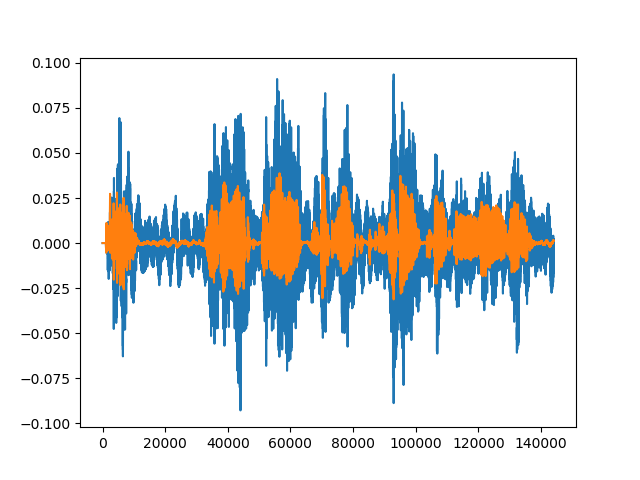

<IPython.core.display.Javascript object>


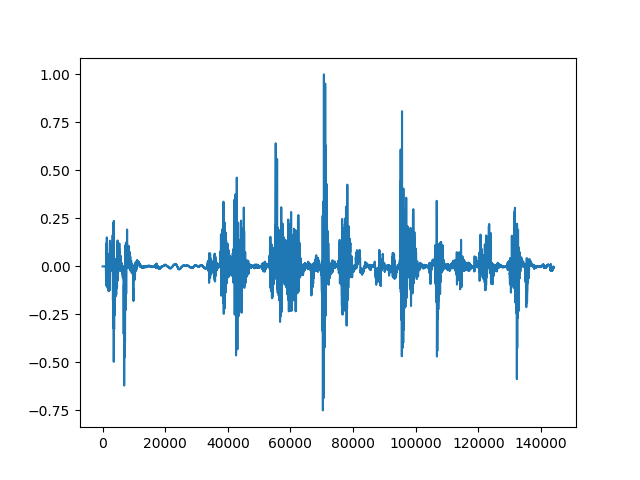

<IPython.core.display.Javascript object>


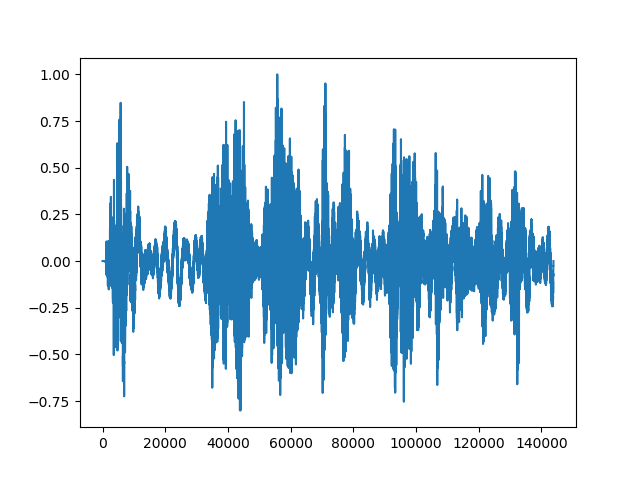

<IPython.core.display.Javascript object>


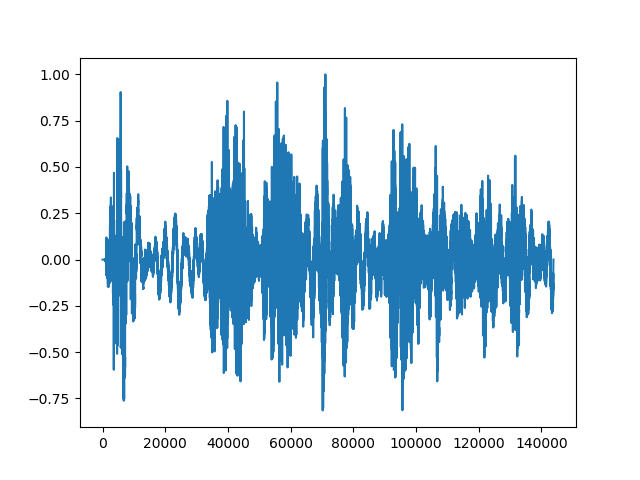

<IPython.core.display.Javascript object>


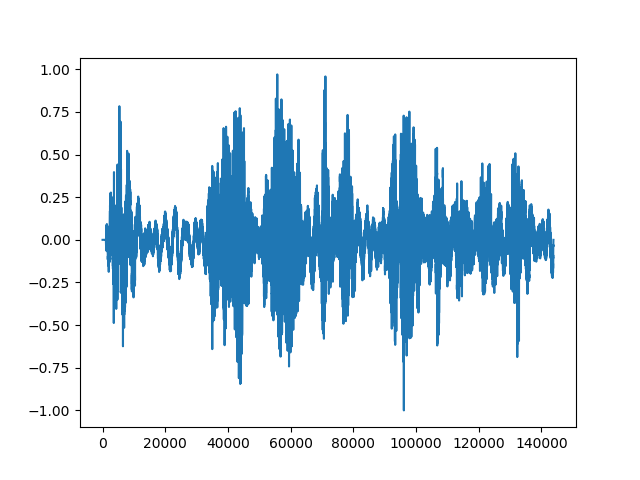

In [20]:
# beamformer test
import beamformer
import importlib
importlib.reload(beamformer)
from beamformer import WebrtcBeamformer, OnlineMVDRBeamformer
buffer_size_webrtc=256 # approx. 5ms
buffer_size_mvdr=256
#webrtc_path='../projects/webrtc_beamformer/deepbeam/beamform_mic_array'
webrtc_path='/home/ubuntu/lib/beamform_mic_array'

beamformers=[WebrtcBeamformer(buffer_size_webrtc, R_global, fs, webrtc_path, cache_path), 
             OnlineMVDRBeamformer(buffer_size_mvdr, R_global, fs, V, False), # superdirective
             OnlineMVDRBeamformer(buffer_size_mvdr, R_global, fs, V, True, False), # mvdr
             OnlineMVDRBeamformer(buffer_size_mvdr, R_global, fs, V, False, False, True) # delay-and-sum
            ]

ipd.display(ipd.Audio(total, rate=48000))
plt.figure()
plt.plot(total[0])
plt.plot(premix[0,0][:144000])
plt.show()
ipd.display(ipd.Audio(total[0]-premix[0,0][:144000], rate=48000))

for bf in beamformers:
    newaudio=bf.process(total.T, angles[0])
    ipd.display(ipd.Audio(newaudio, rate=48000))
    plt.figure()
    plt.plot(newaudio)
    plt.show()

In [21]:
if TEST:
    ang=1.28
    signal=beamformers[1].process(total.T, ang)
    plt.figure()
    plt.plot(premix[0].reshape((-1,))[:140000])
    plt.plot(signal[:140000])


In [22]:
# test webrtc beamformer

if TEST:

    from util import si_sdr
    xs=[]
    ys=[]

    def get_power(signal):
        return np.sum(signal**2)/signal.size
    for ang in np.arange(0, 2*np.pi, 0.05):
        if ang%0.5<0.05:
            print(ang)
        signal=beamformers[0].process(total.T, ang)
        xs.append(ang)
        ys.append(si_sdr(signal[:140000], premix[0].reshape((-1,))[:140000]))
        #ys.append(get_power(signal))

    plt.figure()
    plt.plot(xs,ys)
    plt.show()


In [23]:
if TEST:
    for ang in np.arange(-3, -2, 0.1):
        print(ang)
        signal=beamformers[0].process(total.T, ang)
        ipd.display(ipd.Audio(signal, rate=48000))

In [24]:
# test mvdr beamformer
if TEST:
    from util import si_sdr
    xs=[]
    ys=[]

    def get_power(signal):
        return np.sum(signal**2)/signal.size
    for ang in np.arange(0, 2*np.pi, 0.05):
        if ang%0.5<0.05:
            print(ang)
        signal=beamformers[1].process(total.T, ang)
        xs.append(ang)
        #ys.append(get_power(signal))
        ys.append(si_sdr(signal[:140000], premix[0].reshape((-1,))[:140000]))
    plt.figure()
    plt.plot(xs,ys)
    plt.show()


In [25]:
class SimulationBeamformedDataset():
    def __init__(self, simulationDataset, beamformers, cache_folder, cache_max=None):
        self.beamformers=beamformers
        self.dataset=simulationDataset
        
        self.cache_folder=cache_folder
        self.cache_history=[]
        self.cache_max=cache_max
        
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        
        if self.cache_folder is not None:
            cache_path=self.cache_folder+'/sbd-'+str(idx)+'.npz'
            
            if cache_path not in self.cache_history:
                self.cache_history.append(cache_path)
            
                if self.cache_max is not None and self.cache_max==len(self.cache_history):
                    # delete first one
                    first=self.cache_history[0]
                    os.remove(first)
                    self.cache_history=self.cache_history[1:]
                
            if os.path.exists(cache_path):
                cache_result=np.load(cache_path, allow_pickle=True)['data']
                return cache_result[0], cache_result[1], cache_result[2], cache_result[3]
        else:
            cache_path=None
        
        total, premix_w_reverb, source_angles, premix, background=self.dataset[idx]
        # choose the first component
        bfdata=np.zeros((len(self.beamformers), total.shape[1]))
        for i in range(len(self.beamformers)):
            res=self.beamformers[i].process(total.T, source_angles[0])[:total.shape[1]]
            if len(res)<total.shape[1]: 
                bfdata[i]=np.pad(res, (0, total.shape[1]-len(res)), 'constant')
            else:
                bfdata[i]=res[:total.shape[1]]
                
                
        # currently only need total, bfdata and premix
        gt=premix[0, :, :total.shape[1]]
        # save cache
        if cache_path is not None:
            np.savez_compressed(cache_path, data=[total, bfdata, gt, source_angles[0]])
        
        return total, bfdata, gt, source_angles[0]
    
        #return total, bfdata, premix_w_reverb[0, :, :total.shape[1]], source_angles[0], premix[0, :, :total.shape[1]], background
    

In [26]:
import util
importlib.reload(util)
from util import si_sdr, calculate_gain

train_dataset=SimulationBeamformedDataset(dataset, beamformers, '../bf_cache', 600)

simulation_config_test={
    'seed':5,
    'min_snr':5,
    'max_snr':20,
    'special_noise_ratio':0.8,
    'max_source':3,
    'min_angle_diff':25,
    'max_rt60': 0.3,
    'max_room_dim':[10,10,4],
    'min_room_dim':[4,4,2],
    'min_dist': 0.8,
    'min_gap': 1.2,
    'max_order':5,
    'randomize_material_ratio':0.5,
    'max_latency':0.5,
    'random_volume_range': [0.7, 1]
}
testset=OnlineSimulationDataset(vctk_audio, ms_snsd, 50, simulation_config_test, truncator, None, 50)
test_dataset=SimulationBeamformedDataset(testset, beamformers, '../bf_cache_test', 600)

N=5
gains=np.zeros((N, 4))
for i in range(N):
    total, bfdata, premix, angle=train_dataset[i]
    print(total.shape, bfdata.shape, premix.shape)
    for j in range(len(bfdata)):
        bf=bfdata[j]
        gain, _,_=calculate_gain(premix[0], total[0], bf)
        gains[i, j]=gain

(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)
(6, 144000) (4, 144000) (1, 144000)


In [27]:
train_dataset[0][0].shape

(6, 144000)

<IPython.core.display.Javascript object>


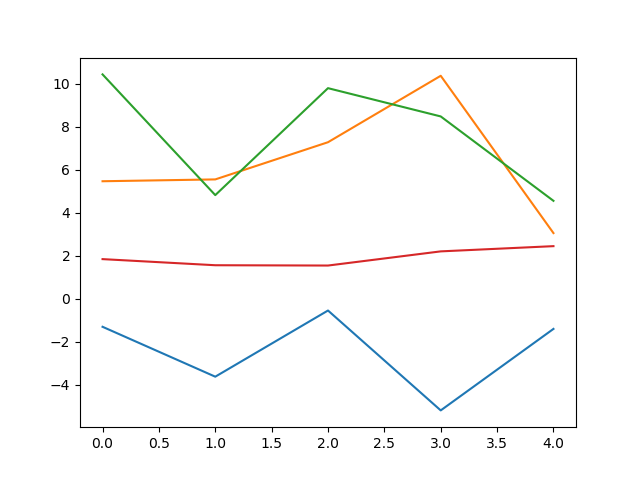

In [28]:
plt.figure()
for i in range(4):
    plt.plot(gains[:,i])
plt.show()

In [29]:
import gc
gc.collect()

18932

In [30]:
# simple model
import gc
import time
import model
importlib.reload(model)
from model import SimpleNetwork

import torch
from torch import optim
from torch.optim.lr_scheduler import StepLR

BATCH=2

dataloader=torch.utils.data.DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=1)
testloader=torch.utils.data.DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=1)

def train_epoch(model, device, optimizer, scheduler, dataloader, save_path=None):
    model.train()
    losses=[]
    tick0=time.time()
    for batch_idx, (total, bfdata, premix, angles) in enumerate(dataloader):
        tick1=time.time()
        data_all=torch.Tensor(np.concatenate([total, bfdata], axis=1))
        data=data_all.to(device)
        premix_gpu=premix.to(device)
        optimizer.zero_grad()
        tick2=time.time()
        
        angles=torch.stack((torch.sin(angles), torch.cos(angles)), axis=-1).float()
        angles=angles.to(device)
        # print(data.shape)
        output=model(data, angles)
        
        #total_gpu=total[:,0,:].to(device)
        #loss=model.loss(total_gpu, output, premix_gpu)
        loss=model.loss(output, premix_gpu, None)
        loss.backward()
        
        #torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()
        tick3=time.time()
        l=loss.item()
        
        data=None
        premix=None
        #gc.collect()

        #cutorch.empty_cache()        
        tick4=time.time()
        print(l) #, tick1-tick0, tick2-tick1, tick3-tick2, tick4-tick3)
        losses.append(l)
        
        # print()
        tick0=tick4
        
    scheduler.step()
    if save_path is not None:
        torch.save(model.state_dict(), save_path)
        print("saved")
    
    return np.mean(l)

def load_path(model, path):
    model.load_state_dict(torch.load(path))


In [31]:
device = torch.device('cuda')
network=SimpleNetwork(10, 80, 16, 128, depth=5)
lr=1e-3
decay=0
optimizer = optim.Adam(network.parameters(), lr=lr, weight_decay=decay)
scheduler = StepLR(optimizer, step_size=8, gamma=0.5)
network.to(device)

SimpleNetwork(
  (encoders): ModuleList(
    (0): ModuleDict(
      (conv): CausalComplexConv1d(
        (pad): ConstantPad1d(padding=(14, 0), value=0)
        (activation): Tanh()
        (l): ComplexConv1d(
          (conv_re): Conv1d(80, 80, kernel_size=(16,), stride=(2,))
          (conv_im): Conv1d(80, 80, kernel_size=(16,), stride=(2,))
        )
      )
      (relu): Tanh()
    )
    (1): ModuleDict(
      (conv): CausalComplexConv1d(
        (pad): ConstantPad1d(padding=(14, 0), value=0)
        (activation): Tanh()
        (l): ComplexConv1d(
          (conv_re): Conv1d(80, 80, kernel_size=(16,), stride=(2,))
          (conv_im): Conv1d(80, 80, kernel_size=(16,), stride=(2,))
        )
      )
      (relu): Tanh()
    )
    (2): ModuleDict(
      (conv): CausalComplexConv1d(
        (pad): ConstantPad1d(padding=(14, 0), value=0)
        (activation): Tanh()
        (l): ComplexConv1d(
          (conv_re): Conv1d(80, 80, kernel_size=(16,), stride=(2,))
          (conv_im): Conv

In [32]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print(count_parameters(network))

1419222


In [33]:
# prints currently alive Tensors and Variables
import torch
import gc
for obj in gc.get_objects():
    try:
        if torch.is_tensor(obj) or (hasattr(obj, 'data') and torch.is_tensor(obj.data)):
            print(type(obj), obj.size())
    except:
        pass

<class 'torch.nn.parameter.Parameter'> torch.Size([80, 80, 4])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 80, 4])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 80, 4])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 1])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 1])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 80, 4])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 80, 4])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 1])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<class 'torch.nn.parameter.Parameter'> torch.Size([80, 1])
<class 'torch.nn.parameter.Parameter'> torch.Size([80])
<

/usr/local/share/anaconda3/lib/python3.7/site-packages/torch/distributed/distributed_c10d.py:144: UserWarning: torch.distributed.reduce_op is deprecated, please use torch.distributed.ReduceOp instead
  warnings.warn("torch.distributed.reduce_op is deprecated, please use "


In [34]:
# evaluate
def test_epoch(model, device, testloader):
    model.eval()
    gains=[]
    losses=[]
    inputgains=[]
    with torch.no_grad():
        for batch_idx, (total, bfdata, premix, angles) in enumerate(testloader):
            data_all=torch.Tensor(np.concatenate([total, bfdata], axis=1))
            data=data_all.to(device)
            premix_gpu=premix.to(device)
            angles=torch.stack((torch.sin(angles), torch.cos(angles)), axis=-1).float()
            angles=angles.to(device)
            
            output=model(data, angles)
            
            #total_gpu=total[:,0,:].view(BATCH, 1, -1).to(device)
            loss=model.loss(output, premix_gpu, None)
            losses.append(loss.item())
            # test si-sdr
            output_cpu=output.cpu().detach().numpy()
            for i in range(output_cpu.shape[0]):
                gain, _,_=calculate_gain(premix[i, 0, 24000:], total[i, 0,24000:], output_cpu[i, 0,24000:])
                gains.append(gain)
                gain, _,_=calculate_gain(premix[i,0], total[i,0], bfdata[i,2])
                inputgains.append(gain)
            # print(gain)
    return losses, gains, inputgains


In [35]:
train_losses=[]
test_losses=[]
for i in range(40):
    print("epoch "+str(i))
    train_losses.append(train_epoch(network, device, optimizer, scheduler, dataloader, '../remote/trained/saved.bin'))
    losses, gains, inputgains=test_epoch(network, device, testloader)
    test_losses.append(losses)
    print("avg: ", np.mean(losses), np.mean(gains), np.mean(inputgains))
    

epoch 0
66.10919118781104
57.574390623646565
58.80144173797281
45.75309006801024
35.06219731295528
51.6985215987517
34.349142800660324
69.5593475031465
46.98354122353602
47.456789075586805
17.095751701199696
29.473970796124906
5.828681869983432
36.25900856538168
32.541499145733724
22.92961480715719
23.872817113347494
12.973802403239922
9.015971508433964
32.85306510810072
30.827665361696454
21.910066397525448
8.823601864380622
48.588150400281044
16.529005910258103
2.0373080512693362
10.022459528113828
16.50086049712697
12.728133013678121
13.360796792213906
5.593868468979992
16.013355681448882
8.25084128054681
7.53500594212467
33.07369250283763
15.999988459801294
14.211648284982688
24.101634264779562
26.2002975784624
7.351437093151002
15.330667859951454
19.92461914092126
22.69107690776839
6.815471835262054
6.579464952262073
6.105805956340952
7.006777034815815
17.608400994591037
15.505846742283879
10.197246291593592
18.201025251699495
24.00955386308067
3.412618664124897
13.864137069881231

0.433926513748517
14.013441835373765
12.564809435145731
2.0396039280400293
19.52010886044375
6.869193068412687
-3.190484422104016
22.798127937096172
13.808018338573387
1.579173857438556
7.781585917756983
10.013079697740334
-5.189094290618673
3.812902991128573
5.393016043759711
-2.2723481533383643
16.26077203321756
8.631241520574402
26.96773057184765
9.269155767279557
19.302486737681022
-2.798827652318009
27.59324115841339
15.164914396261572
7.393258508517096
1.90945529123914
7.052721222388085
10.424933640261427
29.30035038213788
-4.29251837920337
-0.3936586507256168
5.841772881399756
4.382766914134269
3.897209689116138
3.4282410810029966
6.2356892254891925
13.455894349295335
15.902508505122091
6.751570563607883
2.4339900020412024
14.437750578344861
-1.3881184183829882
20.277110906189066
11.71115393117647
13.54579155153361
19.349909534195124
9.826515736664792
4.613802886158451
-4.108744587973609
4.481954532962957
8.178493176584462
4.8760017729011045
-4.099403480424362
12.426892458677264

3.8890880628039204
8.756629037025215
25.307652824967676
8.21904876425334
-2.7641916680754277
-2.204558077855607
23.79636447108696
26.943057671744086
32.81770411610751
9.252145504362668
8.933803777807222
-6.812116363508552
-2.2216113979820484
7.76556207020883
12.057751976576219
18.12498662505179
-1.0958342784426236
13.82107990971594
3.7513107896634796
5.298006282537398
4.711030204623398
8.805765797312388
13.965995356777501
1.5129378914619476
24.18040776193483
35.08411256024894
-3.1441604071814777
6.259537125376363
32.28269198630584
3.3971083870067726
7.87647464639149
-0.588248485270698
23.634810935814617
6.674756911874134
21.533409357189882
2.159329494006552
12.782455776455723
17.594240972046272
4.947056965132143
32.96476216558473
2.7369464206583096
16.345885800852244
14.849288773126087
13.610988905412366
7.099306929822047
7.062786574550114
7.400323653704593
9.14402812633847
3.886513917556823
-5.9235686377311225
22.550624853874474
-2.6889421783066894
23.22640755519535
-1.408491374600430

11.189243501399316
55.2641833405884
28.549710591806374
11.035419531271561
14.135464541971439
22.607164675676103
31.817175026941488
31.630732619667313
6.136861797359603
8.661420843304327
7.72446463522788
46.12194292925501
32.51517652883223
15.580381408806977
8.953180637536608
8.64653858657031
1.7607271808049791
18.132635285243776
9.955454327538641
10.00115193555806
20.71203502540054
12.03320444682973
11.156706264987914
16.400236305495294
21.57233948815573
25.86487793785822
13.051808246896014
17.738184201728405
10.566336296383549
25.449514730488822
18.375215324163594
9.179473622703687
6.945843091718569
17.581627867363178
13.86706187188049
11.890294186697053
10.62911845030105
14.733914220732933
13.800235950404925
4.259001578564305
3.886409382095362
21.497343098145862
18.03645665983158
0.6526150647985105
19.28227786501746
28.837715960376844
18.15129494124902
17.216770830630608
14.23716585030403
5.706484449720227
29.37959729318228
-6.781885284378537
8.975688509427407
6.352661575683422
12.49

15.897397256110422
46.95431762223707
17.397499466510098
6.594312410056236
20.892556389915804
saved
avg:  13.268754344219598 5.454807962649975 8.053677587996757
epoch 7
33.23013387574544
11.181938906013384
11.431728912540052
9.413029454936966
9.070253488007657
23.462729292932547
38.88684734347153
7.255436135548465
21.559016971876925
5.285587631372354
20.811376158949525
13.401704935054994
22.51460336107253
11.785516670848272
9.248502363228983
5.100937248219201
3.61371396872359
31.048130501170547
4.480079416507646
7.9512011477741105
23.205375999234327
25.611591061749266
5.637594036161705
12.978623347519953
8.307197689032483
2.7394659649212687
23.152817140689695
5.63311346849032
9.704994776815843
5.508125505418963
22.757458898855997
19.053245090907282
38.69274048023642
14.644295261494072
15.730556584061311
19.815009092240658
4.723808071696323
18.689075533642246
14.02271166200934
12.680778665038149
10.80730649058123
19.251951832253607
13.883581114488935
7.498789834202537
7.7900354221988835


10.873395499735038
15.158054592500932
13.107139742902238
8.844664512935703
1.6677170797784473
13.338355169918584
9.004994786877518
6.015937067451926
12.944469927200986
15.046190379002034
8.520365053832368
0.14984579815318733
13.516989652823575
6.012169248422122
38.81261033326895
11.732079963588799
-6.168655852492261
7.0081569099882834
27.918537057925157
13.055479430741213
31.50199991029484
1.3082953699785462
5.189091825428262
7.727976260249715
-5.459081578932967
16.172699187709743
8.91350967307563
18.443752082695916
35.66775570393641
5.352161806962075
32.07349653190231
4.719967571395006
1.673238847005086
14.046989449285135
1.9515403492388401
-0.30389390756291546
18.51424672056112
11.746840898584146
15.640510212553476
-2.1250700799690656
-1.2157371297327018
0.8418247374410343
14.488853338874723
10.517403378865714
-2.6047268270908384
1.7630082989214477
4.912754720663514
6.221915399071718
28.349327017900215
0.8698088510571407
-1.567665612771571
-2.490803536428844
0.8418772803963108
11.205

6.497732423027109
19.92922405163973
11.978363324534563
11.481620081935006
20.62157969921082
35.23231131797389
12.077305369851352
3.549248351528263
18.253867587711078
-1.9732468425599001
11.18964586491219
13.340594063793004
10.24581965007386
3.1818761442552357
2.9408540805892223
15.988088073961983
-9.384813673384192
26.661042570477584
2.7513754999784847
17.591944525972124
26.551724510047016
7.665782225074951
13.071184414544863
14.73804379401734
18.966831089928473
6.667165751607884
9.56605442854192
29.845944799239078
1.5812350240925297
14.791280391648932
44.80063021961634
26.59202268384857
16.585725927136973
11.256685232397421
15.714520722395783
-3.9701455139702766
17.710755908827863
11.760108649595502
7.327596383235232
32.15419625743789
0.3529702533747203
11.182435255098818
22.772606509311203
13.730831722989445
0.6025167184210576
6.010332481386429
6.1154231161610575
6.683321872631124
36.19057850810924
16.06818659392644
7.576565655206142
2.1094269355121478
10.791169844476801
0.6289583141

15.101588918468057
21.205238963736754
22.799150508544706
-0.8693749084813653
8.608908416661315
6.8391884948687816
1.1766207026465099
9.189523762854051
7.124884939025986
0.6222421473594419
-6.556774365766116
19.93293252300909
22.27120244604174
18.667406792253644
13.641596697363687
-2.2592159227712454
9.497399984838722
4.249717575856676
5.3393843146531665
7.9061211100570645
12.623196881257929
19.26110372463501
6.408649722240623
3.454486746160762
27.63006599497097
16.1219818513772
-1.079428838197105
38.98529827432413
23.311224360646545
17.54075130950325
2.908150949921705
3.6364049993260563
12.474845964793062
5.3341457728379424
4.952815656655993
5.32300794237661
20.046168603027517
4.988371997087182
-3.2256635768057462
-2.499028865138531
7.152617164105302
4.13409202592919
5.142826315734662
0.23587200300872802
15.719945951603219
-1.0150562675200987
4.740584265436216
6.367861068104657
15.594260720531633
29.750380098978958
-5.173746993749599
13.427918828556129
35.81767478403914
24.381809295657

5.0592820475543405
7.917750085483301
9.487067805039995
11.53353051627275
13.778169231199213
9.076708430864082
-1.0208219439467063
24.380179420697726
10.16213713600874
4.731526476991047
12.702315472304088
10.696426573583976
19.613575272611293
10.736425420835932
27.631120935824992
10.242960474647633
9.221942696000745
11.632019298542996
saved
avg:  8.464487016216502 7.637229237798364 8.053677587996757
epoch 14
5.988109452630362
11.88938851322919
12.8868547404537
17.241100760576835
9.91728689050208
4.134086506664963
-5.8651079101476515
9.814685046746282
1.3415749184780756
-1.566645074393349
21.553044893449638
12.348863185912984
20.22324880710432
5.047431630589089
-0.47570870915425
2.5333284396149116
7.3971063781992
20.922180274535144
-4.397232942299372
4.485952053377556
8.464333146544398
4.2452777086310025
3.5121486085054863
9.546136372748283
-1.6691609774410772
14.406757998853323
9.614463115028661
2.3068028557803135
23.89080857271983
21.221169788607483
-3.7491479832383683
3.90948244733006

14.299358531266364
25.60295196524996
7.078224405028896
5.69754805056002
4.842365749531826
16.957449521793894
14.598171309041586
7.851575780753074
28.677030682738774
18.00677481350159
5.802882066870561
24.82069654824815
5.724419340770633
2.1807648060335376
7.216321551034856
23.049484699910792
7.404474454450892
9.246162740173446
16.361031825612727
11.346659368023289
0.9070467596000062
12.428916010776042
7.137814955488899
20.40475952884163
-3.1977137403687577
1.5869927514554674
2.3610301626020824
4.799658784733643
18.404911500119756
-0.3389009006649695
28.077885031794857
4.04870305704004
5.368347906301224
5.0436898518729
13.616503567288582
16.011521146619472
-4.685405680173666
0.9438480862281381
23.46102114166905
-3.8820773448455608
21.79032914663472
22.744898517329265
22.398181142098412
5.160443363351024
10.821845410160984
12.115934970828581
-2.3477297917213162
21.120910338291367
0.17901574045132768
20.27507581033713
20.828084325570362
-0.5366369868644922
-1.3990471872223718
19.640919416

11.40515495120998
17.28224415278015
-4.539155276393016
20.5953000879177
-7.597027136276594
15.09334292402979
-6.8439166791156865
14.237710017296807
18.982597901024043
5.735813897573978
0.5133565361396711
11.036288383602397
31.622261161796864
11.099000323503256
43.106700595399346
23.265688220771576
30.468964379417493
13.869058291593005
9.947001691986408
-3.1710455684091636
9.856903357011747
16.23726144944767
0.6718144650852588
-3.950086382748892
8.809708520112826
5.70733877619904
19.589842244416882
12.039046167875563
6.581500902465558
3.396723561399407
2.0826265033949207
16.63077222619414
13.239439181331527
1.0840516387655712
20.08211323475946
-1.5420744142776606
3.772512595235636
4.097392484472662
26.145201527927814
17.03023340370256
-0.5615857764573553
11.624405169471892
2.0504936084881797
4.713053602317259
10.90105183919922
-5.502905759951318
-2.3493058624089427
16.247299461467794
12.16433188990808
2.626763952919808
31.248959389663334
9.612715548538297
8.16705762795591
4.018104076146

-0.7033916934853535
-7.116234470163157
3.130809084403912
2.079557972212797
17.07988465810687
4.374280725915811
18.59631096839924
5.57686865226609
24.448929279185055
3.178985088385368
4.69581358946688
7.364909971242845
7.09538898661028
4.430041672395998
22.063821934516515
13.364471232946272
16.110811178337244
-5.1187568382703885
1.4574803155556673
-0.5190591459572274
6.7128079082890215
8.089672529788064
27.64820923145799
-2.3217642726747147
11.53079397156715
11.813628574739235
30.654093636339923
11.481111826306718
5.676257880883737
9.867421635182895
13.916207826050014
21.433832692940136
21.447138661442082
3.5940485182085276
-1.3940328975660679
13.101983965559196
3.6915061853359408
19.889922236819263
14.96273261757056
14.214656006758084
30.54907878401946
10.91809051781463
12.306451350344286
9.494519623910499
20.717316427055763
23.41463748809821
2.950420267948704
29.468332300569532
8.57341628166421
17.01017833724646
21.509264058536612
7.122995358864056
0.8072344969319842
0.826776719341687

-1.8596773727902047
6.931361961859093
21.556896277907214
10.087018249108228
10.55064279591329
-0.599737332952635
3.4952200259583535
-0.24651005407935211
24.763241276410646
8.108657493062974
22.17259912499236
18.94081521869984
2.0960648627151146
9.696963032706973
5.10094638681368
33.28310421596079
0.39948228968064026
0.6200618514841443
18.44513778747479
-5.200861712511952
-1.960918314915309
7.724230518869524
16.00464759879558
-4.893738823388654
5.81492936236947
10.434921785889612
10.590534229731356
25.97641258810742
2.074340663253702
4.409933102433997
-2.7002460779960673
16.399977161767023
2.2943038763147277
2.96231614265384
26.988305224512782
saved
avg:  7.876300765989984 7.896540408811846 8.053677587996757
epoch 21
11.979389377068465
1.8590447752668107
3.249395180599958
5.692947581066349
19.2133504909233
-5.815689311364633
-7.250072946206139
22.79048603648871
41.22675348640773
10.744230997361221
-1.1954431065214468
6.081687645621194
3.144974749787992
18.668741149965662
13.928348970499

13.019024721122967
6.463791543341313
15.805030680369748
35.32144013145492
11.35129623099941
4.28228740168358
5.54498521898436
15.462682187386749
4.228457656465938
5.250671552471296
2.119349936801771
12.908728696541484
35.678024811532296
37.37350974157343
11.352306793534236
10.284950992175375
-0.9708034609941962
9.602208639043177
13.551660088894282
10.829527207266093
-2.3957219706475783
1.6731177657717542
12.360486999896453
6.255167303367755
4.556896438487728
9.798504189629233
18.243655447715934
17.35429864533191
-1.1769254012318093
12.217208234664497
4.148281935261499
1.532561001837348
6.441797753277713
2.164556622149589
7.753306582406179
8.178620717478758
32.948070522107265
-3.4255703255796477
2.3072198057636473
3.284171697188074
-1.1458291939167247
2.917330114318549
24.8177439762407
6.309465386512966
12.74509075928954
-0.6813850960330923
7.380086559556726
-3.154828031721147
3.282253509144765
15.064817694458355
8.037897335797812
5.6602847795224225
13.012478363399056
-6.570810248964799

15.207983629384684
9.135280192178625
27.93899037360299
-0.171233585766718
-0.5243900349910509
5.619100842423561
9.155546860472848
-5.108496895771456
1.4973417784816814
1.2018038439226513
9.939252106917094
-3.230220717209623
2.8245522433553223
25.7431206442481
10.31747898318758
8.428466042608193
11.846606355368538
17.01793517256757
11.85978353719031
5.579807554011973
-3.1785099982436478
12.931010778684605
17.692293616888637
19.235636207385404
12.38802451717902
-0.3227759559860244
-0.8774825477777646
13.681186360904174
16.6619980412063
-4.177436113358543
0.358000894664114
-2.0631260870170376
3.337057835792929
24.733433134261013
9.8274442085538
19.733611120725026
-3.8577859992699635
3.20008456571154
5.915897701104798
9.877631943971515
5.864345019883507
-0.3922108258211141
5.312676338101621
17.69640043271007
-7.026945740886921
16.597206003028155
29.520482840402195
6.932554204683525
20.176758192510782
24.419275555196403
27.281034208140067
-0.5584167872984092
9.117037302098256
6.284615667892

15.776185217211275
22.95882878102908
16.73596971194985
2.4308931744973687
-0.6330270609432169
-2.5459668991418356
7.115643296972993
-3.0521444326755645
2.8613549114198786
12.47256288797752
14.892142699463779
-1.3760904680403994
45.70011374712808
22.324075539335624
-1.790449853610298
1.3533451484253445
13.471850402170084
15.690348806334715
13.820625958941774
5.218918837670598
8.522451855028649
15.936084225380089
7.5182841472977255
-1.9187123378248891
10.966674135575833
25.54460027280015
-3.390926582149041
25.626578305773343
14.014608607038063
-1.787914573695556
0.24694404717986274
9.56571972653358
15.96560747008002
3.5881385859728083
15.895576694362376
11.714095018452893
25.416879019641115
9.15841182753648
4.766108581104866
12.60261186268013
4.146635235682288
16.07644295026615
11.260912383963932
9.495749511079705
15.962714847290949
-0.5801290547446343
19.91524145907691
7.765689873550869
14.73577641338968
-0.46028323219873446
14.314132621363433
19.47126523990829
2.498062976566701
13.5682

4.615270581787017
5.135049907261199
11.426284107093643
-2.0118413149588017
9.256868840999527
1.9211703613953186
8.490658170046835
10.676129004335031
-3.220366464973611
43.54578981507446
14.928420118962507
4.966977622292943
11.348941888343933
14.839293175161362
-2.795775334750005
-8.552822016587985
-7.228861825787503
-2.1197352822363227
21.124560777149618
19.42282966125228
0.693771107709092
-2.9201996217520603
5.764449543722806
1.709732928907434
-0.466486147853197
10.33234197444822
15.8376430514243
4.687617817539756
-1.2268892247968797
14.00546878777082
-2.0040540720313613
18.94717212876524
17.137614201202652
34.52395424109025
-2.4352161523725613
14.401258017959105
0.8921297723721735
2.6141400929071374
1.924707914026862
12.231274061582294
-2.3795268856269796
4.221309833138959
20.117896520808415
3.0901666801174734
1.855669979322235
-7.673472579303217
1.9784498689345602
0.12161371273444777
15.497238021585813
3.1372288012173453
-0.6989978896973195
8.616209052706337
3.8573898374672133
12.29

-1.8041709458400774
13.5884271394792
9.07574519477114
23.91611916239484
9.363644798146762
2.984491200949932
12.693769115082244
3.435760208147012
4.251621826993146
12.411421311758891
15.417813753879816
16.04321373046521
5.148341306408128
1.5446221906809476
-2.8680953874490713
4.229998582928847
16.22782926855295
11.935483024537028
22.860668158400596
11.811610193711704
6.645926804852636
13.467420506902716
17.011336493645324
-1.113739341238587
0.20841334808482048
33.44287237413111
3.1931597641907405
1.545273427272422
15.038967204633813
3.2965127891660084
24.260111998659806
-3.6617985468859984
-4.951617710468553
6.552567869924851
14.715700221247879
-4.057138075686805
3.8939045452018757
5.1622505518899215
9.712731897556816
19.270615752149666
16.387822124905078
24.88614826674068
8.743998530627282
-5.076305321867945
22.707738548234357
36.391918061013534
8.759782548269534
6.4144742381713105
12.712557605068216
5.676844407535603
3.9689239778657237
-0.6158765842391931
-8.468525420744344
8.17677433

-3.0615814785345954
0.348577002739928
8.478008284672391
-2.304285610973926
1.590788737717348
18.674455052667653
14.88863451939238
0.9741252784838169
10.81517781785172
-7.384609609452961
4.704259868852701
-0.17132101252724352
2.6068480399641785
-2.655460626767466
1.4597636484556071
1.067602617955549
-0.38644224727021903
1.440334977753372
6.604289348137546
-1.1500978114661642
26.722903141058488
-3.9931612947750192
1.9776971783066113
5.269492855251177
2.255603394857688
10.975486806738001
1.929890183469705
12.113515405185105
7.053146830494073
30.71339414683854
-0.6424371445113044
-9.27565023588674
-6.090687742322102
5.1953477066832505
5.981533363424495
5.899827305667318
-1.57628553877448
10.303247756346234
6.461913125129414
2.2521270434190135
21.77664059371031
21.452663931249813
3.180203130045475
-1.785466925728052
11.939294944990777
13.511737445633157
1.0488848117098035
6.659546886328796
20.724407620216144
7.555374079890189
-0.7189825955743383
14.3154894618491
27.536853860195325
13.952785

6.4435361254019865
4.343930017523297
2.9228615259179476
6.6351450182094
26.087094435722246
4.2498614068426654
saved
avg:  7.2368932708636615 8.187614590285134 8.053677587996757
epoch 33
16.09887110709361
5.669084494802171
10.342504797503338
4.196473316268628
-5.145950883443183
12.367977107787318
10.830203752068376
12.03331862873851
16.921835978836047
2.6703377640281225
0.586881325105113
3.535328421751728
13.212410415732583
4.019729281362567
-6.157263888578568
7.3307208770193215
18.027161647725425
-2.988902665330646
5.028089090048918
2.375371092304554
11.157212394380535
15.479546098193055
-1.625640574144379
25.780240798973374
13.899261939632694
32.1095334842145
11.601273719205334
-0.9805809984049616
5.063825367239609
8.137575722186993
13.607831116816321
11.15709033964371
9.221207542404
-2.3538441301327055
26.741086984218363
5.173232922687711
-9.404836243614207
19.46972401607958
30.98068377362515
18.831017452734972
12.243680458848267
0.8189336581099584
8.700939670716359
21.82830032797536

9.082481828621376
-4.3886080918416255
-0.0021072538970339227
14.788544244097544
0.0006447804757449618
21.392171167332727
-0.031033655911143487
28.50103880090785
6.519814051955838
1.78036440208959
13.354036987676814
5.006240452243119
21.140792825954254
-0.6764634024245155
6.735738446378602
-5.934505142922432
11.257674241186287
15.444355863489516
18.283488738461585
14.161630716515571
4.870913491027364
3.2657943682732777
7.136398823758473
-4.391453860309808
11.975166270531252
0.9707588736129671
16.543565316105255
16.89867764984118
11.916239076521876
13.804763685049675
5.097495135549869
25.591280717334282
7.763937416708003
0.4951214423874246
5.731646681723723
18.784073227857263
1.9932379449086155
-4.038180283907291
0.6629480346462593
2.5687409947367716
15.164581441177475
-5.954451750874571
14.2405144755233
-0.772637154957315
9.471013696566782
-5.255972618168009
24.711183424340895
0.05228081321400979
8.83454013025864
30.281782411096735
-2.9949324732512053
8.98749130180494
10.65207311699276


0.09528381146109832
14.603502214824388
28.94463180723137
7.334295962251062
17.17012613433515
7.699543130426655
-2.616070577204989
-0.49566090527874995
12.988298844777747
-3.6839894309464216
-0.7535198993392147
10.730196617799596
14.288128423758344
8.84719388872304
-2.2660111904106977
-0.6387751013291214
5.428742829500564
1.4934351711753688
2.9321265170385287
4.448233695243333
4.063378500994724
12.276864933430858
-5.4571867556232085
-4.782485121030961
-0.19856499897755242
18.10920085344978
5.458332927413752
7.292979343726613
7.334655385693921
19.023545467111525
-5.753796827288215
6.135037005193686
14.436406584558096
5.700998487702474
1.7180972460921788
11.46072434772939
20.328721141206998
8.863194423630851
13.999162251457001
2.520101030281783
6.098630333642874
16.28046953936738
-3.0963545235940524
17.193367279100215
6.743591642961463
14.84122148684214
8.151202726636281
18.14617883408651
15.374361111409033
7.8183531753378785
4.563918710766683
-1.4097300759428917
-2.4154438803205323
-4.60

2.505153247588493
3.772600042985952
8.50557620034679
-3.0304225615946576
1.4615393550472304
8.125864319157197
0.8421974259443239
-0.33571144209756065
10.024091460438624
4.524017931573621
14.799237156439215
2.285558781368806
8.035198676451909
-6.100240292974817
-3.2077852281294263
1.3448147285378755
-2.824111263646163
12.486161262229622
-2.6074825513774194
-1.645703103530344
11.515761180670758
-2.8373810145969935
5.139559589749103
6.177449667209039
12.539595664027239
8.45952282799649
18.05120961869951
-1.204095913684013
2.978432129963271
7.120925776126349
-1.3940555959891263
4.9252258231891
15.153085813320812
3.6581805790189157
12.146619368323663
-3.5983620029230234
-2.882332208095202
-0.7204551159613146
0.8782756027988015
25.286906359975685
-3.8733309250400403
25.285099255861077
25.73567491014949
15.052783292072139
19.311354327750138
12.491130352376038
6.124070908786278
21.20472548904976
2.4866009852793978
-7.822568610465363
-0.16707346869089412
11.537476630022823
20.78026313672271
9.8

8.613466310735378
10.027522849969696
-0.7694142393361402
8.882916586456354
-0.21532757959158388
2.449085127822284
16.636161077257498
-6.4773026711684745
-0.251655064596221
-5.24074024274088
2.7883261289493326
13.42478005535283
11.064797221462248
-0.5684153590771794
14.72095793796063
-2.3275196544310637
-4.999957806871687
2.481912248302054
14.99799744029528
19.64135734411989
0.18173774961326394
38.3123085372014
28.874744293407176
-5.341103631411321
11.827005542290907
6.365404375707941
-1.0023357813437714
17.60103894682811
saved
avg:  6.90899521532646 8.355941285802151 8.053677587996757


<IPython.core.display.Javascript object>


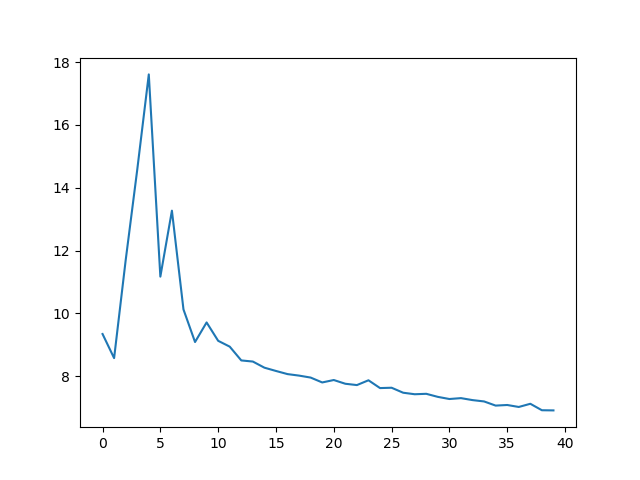

In [37]:
plt.figure()
#plt.plot(train_losses)
plt.plot([np.mean(l) for l in test_losses])

In [34]:
load_path(network, '../remote/trained/saved.bin')

In [ ]:
from complexcnn.modules import ComplexConv

## Parameters Below are totally random
input_channel = 3
output_channel = 24
kernel_size = (5,5)

complex_conv = ComplexConv(input_channel, output_channel, kernel_size)

d = complex_conv(torch.zeros(5, 2, 3, 5, 5))
print(d.shape)

In [38]:
# listen test
def test_data(model, device, data):
    model.eval()
    with torch.no_grad():
        (total, bfdata, premix, angles)=data
        data_all=torch.Tensor(np.concatenate([total, bfdata], axis=1))
        angles=torch.stack((torch.sin(angles), torch.cos(angles)), axis=-1).float()
        angles=angles.to(device)
        data=data_all.to(device)
        premix_gpu=premix.to(device)
        output=model(data, angles)
        output_cpu=output.cpu().detach().numpy()
        
    return total[:,0], bfdata[:,:], output_cpu[:,0]

In [40]:
for batch in testloader:
    total, bfdata, output_cpu=test_data(network, device, batch)
    break

i=1
    
ipd.display(ipd.Audio(total[i], rate=48000))
ipd.display(ipd.Audio(bfdata[i,0], rate=48000))
ipd.display(ipd.Audio(bfdata[i,1], rate=48000))
ipd.display(ipd.Audio(bfdata[i,2], rate=48000))
ipd.display(ipd.Audio(output_cpu[i], rate=48000))

<IPython.core.display.Javascript object>


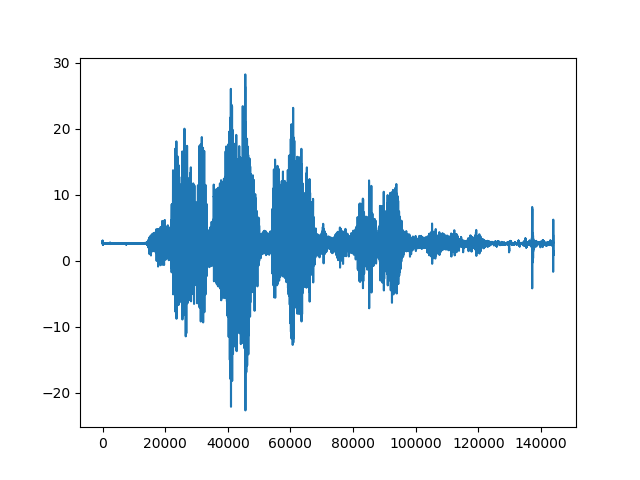

In [37]:
plt.figure()
plt.plot(output_cpu[i])

In [39]:
for param_group in optimizer.param_groups:
        param_group['lr'] = lr